## EDEP SIMULATION ANALYSIS ## 

*The objective of this script is to analyze the neutral current events obtained through a Monte-Carlo's simulation.*

The data is located in a ".hdf5" file which contains all the raw data in a no array-like structure. The data is set different from each other using the numpy datatype method. The contents of the file have five different kind of main distinc arangements:
- mc_hdr (has the information for the kind of event we are seeing)
- mc_stack
- segments (The true hits of particles)
- trajectories (The simulated trajectories of the particles)
- vertices

On each, the data can be contrasted from other using the dtype method. 

**NOTE**: I'm using the NDLAR simulation converted to hdf5 file from local.

In this Notebook I'll try to make some energy cuts to the plots of the interactions. 
Try to emphasize on the color an on the size of the events. Probably add markers per every CC event. 
Also try to add markers per every DIS. 

### Let's start the program ###

In [28]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import h5py
import numpy as np
from matplotlib import cm, colors

#Let's import the file:
sim_file='C:/Users/enriq/Documents/MicroProdN1p2_NDLAr_1E18_RHC.convert2h5.nu.0000100.EDEPSIM.hdf5'
sim_h5= h5py.File(sim_file,'r')
#And observe the file contents.
print('\n----------------- File content -----------------')
print('File:',sim_file)
print('Keys in file:',list(sim_h5.keys()))
for key in sim_h5.keys():
    print('Number of',key,'entries in file:', len(sim_h5[key]))
print('------------------------------------------------\n')
# Let's split the datasets that we have.
mc_hdr = sim_h5['mc_hdr']
mc_stack = sim_h5['mc_stack']
segments = sim_h5['segments']
trajectories = sim_h5['trajectories']
vertices= sim_h5['vertices']
# Also let's declare the  particles that we would like to see.
# This will come in handy later on the scipt
pdg_color = { 
11 : 'blue', #electron
13 : 'purple', #muon
22 :  'yellow', #gamma
2212:  'black', #proton
2112:  'gray', #neutron
111:   'pink', #pi0
211:   'cyan', #pi+
0: 'red',
11: 'blue', #positron
#14: 'green' # muon neutrino
}
labels = pdg_color.keys()
#Let's also print the information inside the mc_hdr for the type of events that we have.
print("Kinds of objects inside the mc_hdr dataset: ")
print("")
print(mc_hdr.dtype)
print("")
#We put the information of one event in just one dataset
mc_event=mc_hdr[mc_hdr['event_id']==100001]
events_ids, counts=np.unique(segments['event_id'],return_counts=True)
print(mc_event)
print("")
print("number of events")
print(events_ids,counts)


----------------- File content -----------------
File: C:/Users/enriq/Documents/MicroProdN1p2_NDLAr_1E18_RHC.convert2h5.nu.0000100.EDEPSIM.hdf5
Keys in file: ['mc_hdr', 'mc_stack', 'segments', 'trajectories', 'vertices']
Number of mc_hdr entries in file: 2040
Number of mc_stack entries in file: 19137
Number of segments entries in file: 6582081
Number of trajectories entries in file: 4369814
Number of vertices entries in file: 2040
------------------------------------------------

Kinds of objects inside the mc_hdr dataset: 

{'names': ['event_id', 'vertex_id', 'x_vert', 'y_vert', 'z_vert', 't_vert', 'target', 'reaction', 'isCC', 'isQES', 'isMEC', 'isRES', 'isDIS', 'isCOH', 'Enu', 'nu_4mom', 'nu_pdg', 'Elep', 'lep_mom', 'lep_ang', 'lep_pdg', 'q0', 'q3', 'Q2', 'x', 'y'], 'formats': ['<u4', '<u8', '<f4', '<f4', '<f4', '<f8', '<u4', '<i4', '?', '?', '?', '?', '?', '?', '<f4', ('<f4', (4,)), '<i4', '<f4', '<f4', '<f4', '<i4', '<f4', '<f4', '<f4', '<f4', '<f4'], 'offsets': [0, 8, 16, 20, 24

In [12]:
event_info=mc_hdr[mc_hdr['event_id']==100000]
cc_event=event_info[event_info['isCC']==True]
cc_event

array([(100000, 1000000000,  347.4595  ,  112.21897  , 562.7635 , 0.19054737, 18,  3,  True, False, False, False,  True, False,  3678.3328, [ 2.5228792e+01, -3.6009097e+02,  3.6605779e+03,  3.6783328e+03],  14,  1278.4069 ,  1274.0332 , 36.32304  ,  13, 2399.9258 , 2726.1804 , 1672415.5 , 0.37135363, 0.65244937),
       (100000, 1000000001, -186.64621 , -128.37065  , 812.28033, 0.45689162, 18,  4,  True, False, False,  True, False, False,  2494.7148, [-9.7106171e+00, -2.5947363e+02,  2.4811653e+03,  2.4947148e+03], -14,  2068.077  ,  2065.3762 , 11.285349 , -13,  426.63785,  598.4406 ,  176111.3 , 0.21997285, 0.1710167 ),
       (100000, 1000000002,  182.7647  ,   -1.7503616, 896.324  , 0.53219415, 18,  4,  True, False, False,  True, False, False,  2979.4346, [ 1.2703954e+01, -3.0812622e+02,  2.9634316e+03,  2.9794346e+03], -14,  2618.525  ,  2616.3926 ,  9.014041 , -13,  360.9096 ,  520.5125 ,  140677.53, 0.20771486, 0.12113363),
       (100000, 1000000006, -142.75063 ,  -29.255714 , 

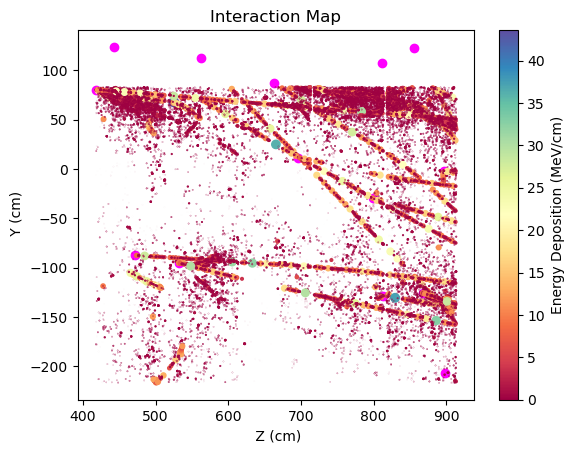

In [33]:

id=100000
event_seg=segments[segments['event_id']==id]
event_info=mc_hdr[mc_hdr['event_id']==id]
cc_event=event_info[event_info['isCC']==True]
filt_seg=event_seg[event_seg['dE']>0]
figure, bars= plt.subplots()
norm=colors.Normalize(0,np.max(filt_seg['dE']))
bars.set_title("Interaction Map")
bars.set_xlabel(" Z (cm)" )
bars.set_ylabel(" Y (cm)")
bars.scatter(cc_event['z_vert'],cc_event['y_vert'],marker='o',c='magenta')
bars.scatter(filt_seg['z'],filt_seg['y'],c=filt_seg['dE'],cmap='Spectral',s=filt_seg['dE'])
figure.colorbar(cm.ScalarMappable(norm=norm,cmap='Spectral'),ax=bars,label="Energy Deposition (MeV/cm)")

100000
100001
100002
100003
100004
100005
100006
100007
100008
100009
100010
100011
100012
100013
100014
100015
100016
100017
100018
100019
100020


C:\Users\enriq\AppData\Local\Temp\ipykernel_12328\1167842833.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure, bars= plt.subplots()


100021
100022
100023
100024
100025
100026
100027
100028
100029
100030
100031
100032
100033
100034
100035
100036
100037
100038
100039
100040
100041
100042
100043
100044
100045
100046
100047
100048
100049
100050
100051
100052
100053
100054
100055
100056
100057
100058
100059
100060
100061
100062
100063
100064
100065
100066
100067
100068
100069
100070
100071
100072
100073
100074
100075
100076
100077
100078
100079
100080
100081
100082
100083
100084
100085
100086
100087
100088
100089
100090
100091
100092
100093
100094
100095
100096
100097
100098
100099
100100
100101
100102
100103
100104
100105
100106
100107
100108
100109
100110
100111
100112
100113
100114
100115
100116
100117
100118
100119
100120
100121
100122
100123
100124
100125
100126
100127
100128
100129
100130
100131
100132
100133
100134


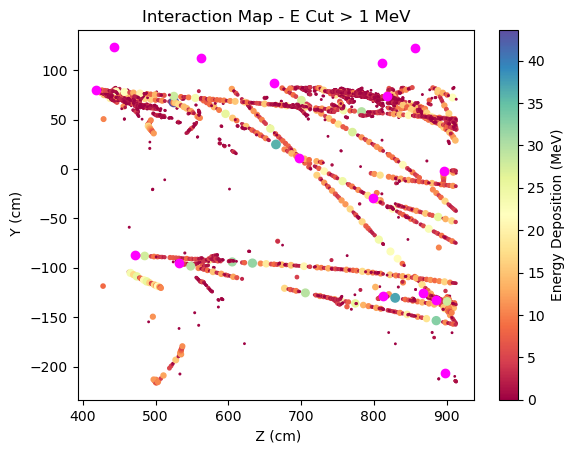

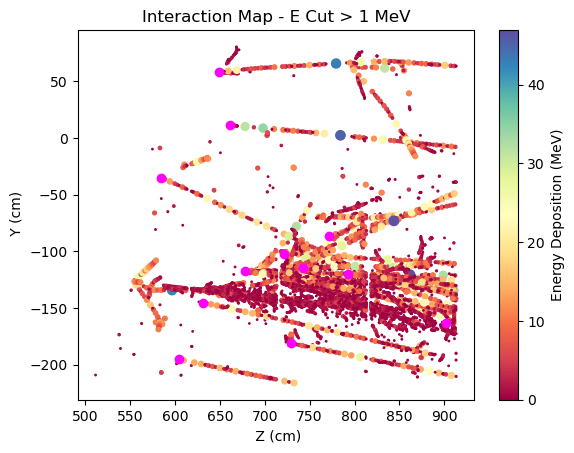

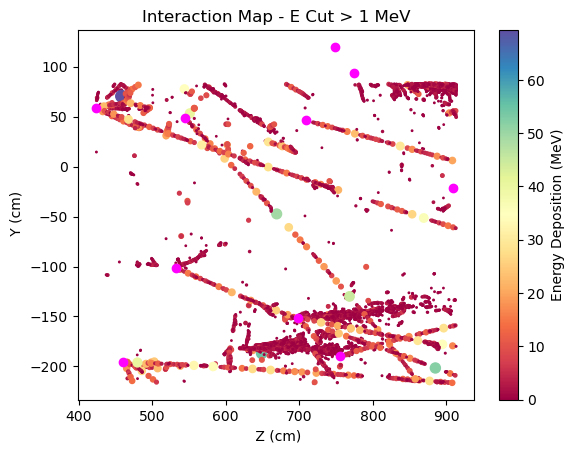

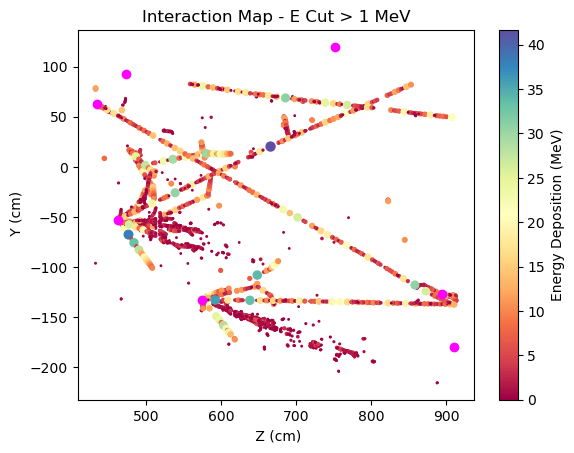

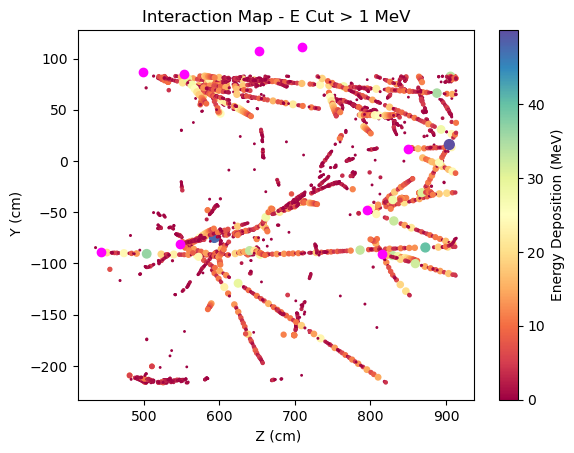

...

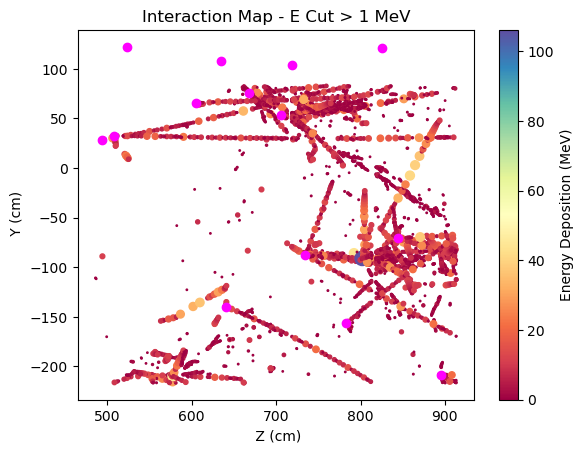

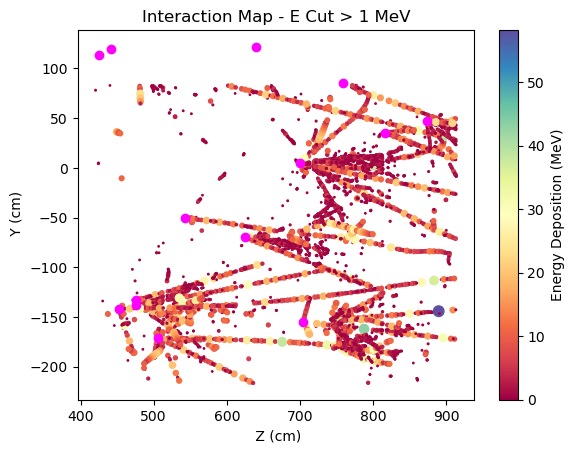

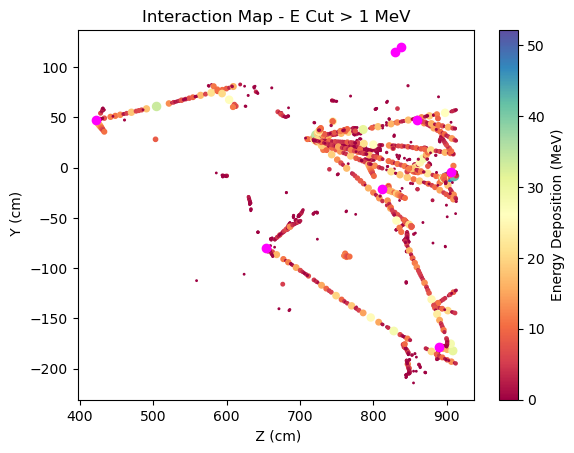

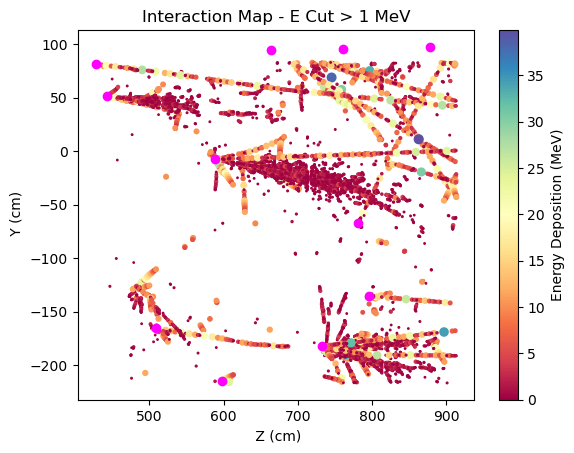

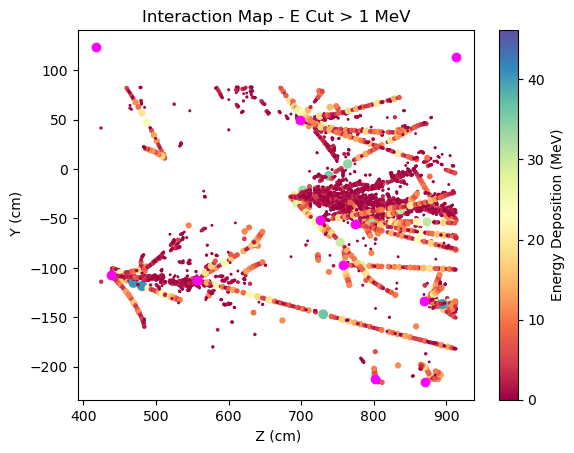

<Figure size 640x480 with 0 Axes>

In [27]:
file=PdfPages("Interaction Maps 2.pdf ")
for id in events_ids:
    print(id)
    event_seg=segments[segments['event_id']==id]
    filt_seg=event_seg[event_seg['dE']>1]
    event_info=mc_hdr[mc_hdr['event_id']==id]
    cc_event=event_info[event_info['isCC']==True]
    figure, bars= plt.subplots()
    norm=colors.Normalize(0,np.max(filt_seg['dE']))
    bars.set_title("Interaction Map - E Cut > 1 MeV")
    bars.set_xlabel(" Z (cm)" )
    bars.set_ylabel(" Y (cm)")
    
    bars.scatter(filt_seg['z'],filt_seg['y'],c=filt_seg['dE'],cmap='Spectral',s=filt_seg['dE'])
    bars.scatter(cc_event['z_vert'],cc_event['y_vert'],marker='o',c='magenta')
    figure.colorbar(cm.ScalarMappable(norm=norm,cmap='Spectral'),ax=bars,label="Energy Deposition (MeV)")
    file.savefig(figure)
figure.clear()
file.close()


In [20]:
file.close()